## Train

In [1]:
import json, random
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

jsonl_path = "/glob/g01-cache/pf/Yushuo/vjepa201/data/spar_sftqa_train.jsonl"
jsonl_path = "/glob/g01-cache/pf/Yushuo/vjepa201/data/spar_sftqa_eval.jsonl"
rows = [json.loads(l) for l in open(jsonl_path)]
print(f"Total rows: {len(rows)}")

Total rows: 4769873


## old

spar/
├── rxr/
├── scannet/
│   ├── images/
│   |   └── scene0000_00/
│   |       ├── image_color/
│   |       ├── video_color/
│   |       ├── image_depth/           # only in SPAR-7M-RGBD
│   |       ├── video_depth/           # only in SPAR-7M-RGBD
│   |       ├── pose/                  # only in SPAR-7M-RGBD
│   |       ├── video_pose/            # only in SPAR-7M-RGBD
│   |       ├── intrinsic/             # only in SPAR-7M-RGBD
│   |       └── video_idx.txt
│   └── qa_jsonl/
│       ├── train/
│       |   ├── depth_prediction_oo/
│       |   |   ├── fill/
│       |   |   |   └── fill_76837.jsonl
│       |   |   ├── select/
│       |   |   └── sentence/
│       |   ├── obj_spatial_relation_oc/
│       |   └── spatial_imagination_oo_mv/
│       └── val/
├── scannetpp/
└── structured3d/

distance_infer_center_oc_mv    n=409846
depth_prediction_oc_mv         n=257085
distance_prediction_oo_mv      n=256944
distance_prediction_oc_mv      n=255487
distance_infer_center_oo_mv    n=253327
depth_prediction_oo_mv         n=247409
depth_prediction_oc            n=245860
distance_prediction_oc         n=240380
depth_prediction_oo            n=201070
obj_spatial_relation_oc_mv     n=199746
obj_spatial_relation_oo_mv     n=199562
obj_spatial_relation_oo        n=196650
position_matching              n=192346
distance_prediction_oo_video   n=189858
distance_infer_center_oo_video n=188921
spatial_imagination_oc         n=185197
spatial_imagination_oc_mv      n=184145
spatial_imagination_oo         n=181196
distance_prediction_oo         n=171670
camera_motion_infer            n=168241
distance_infer_center_oo       n=158616
distance_infer_center_oc       n=95975
spatial_imagination_oo_mv      n=52562
room_size                      n=37780


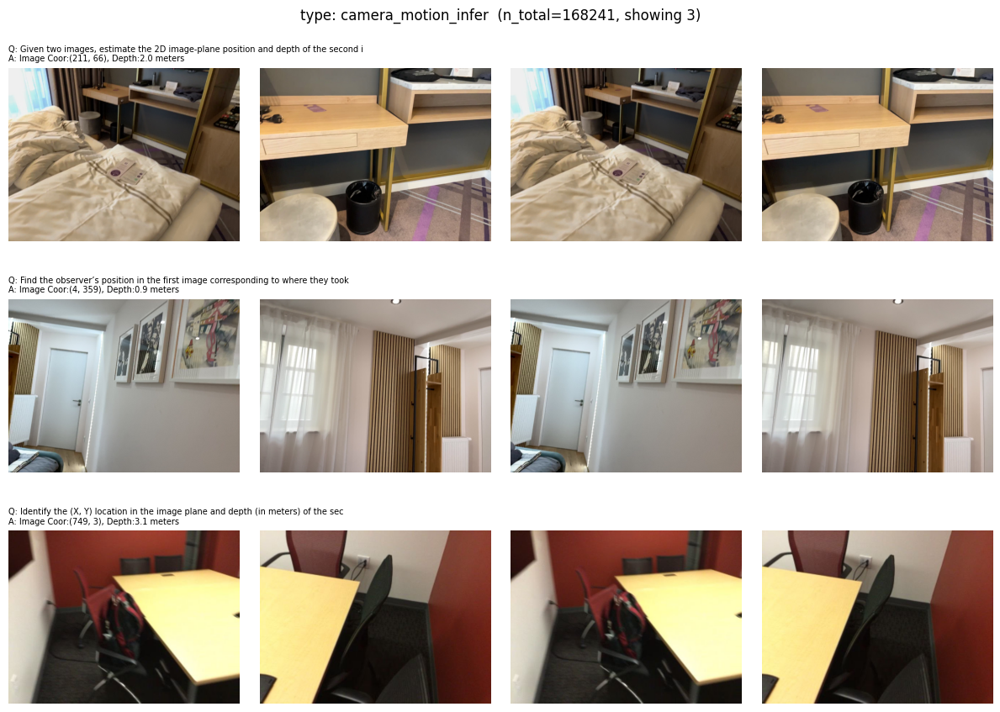

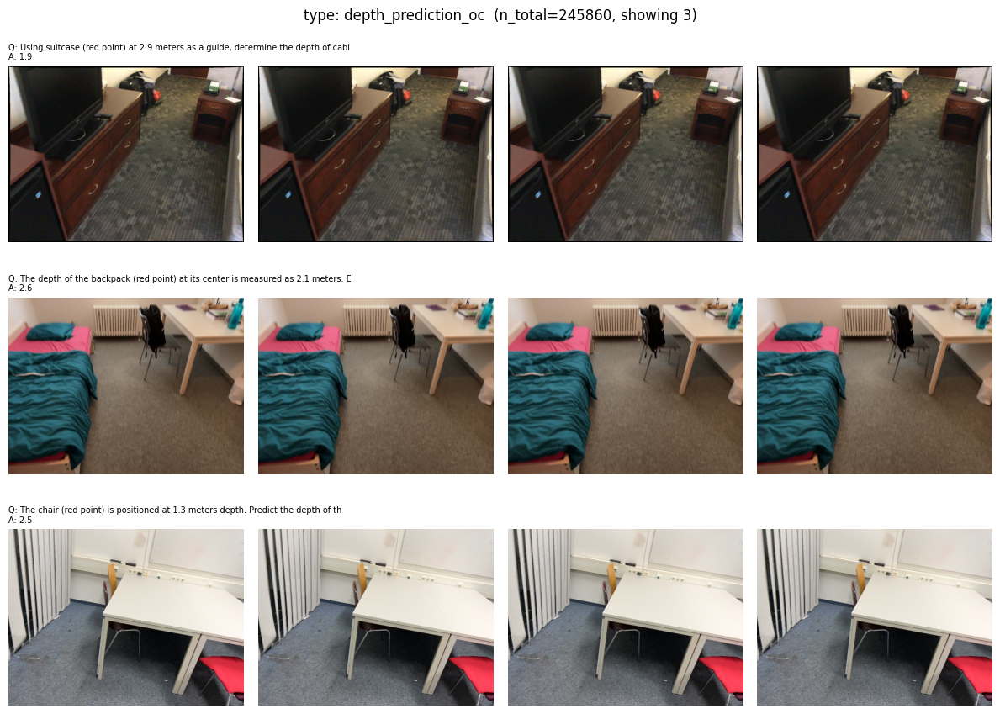

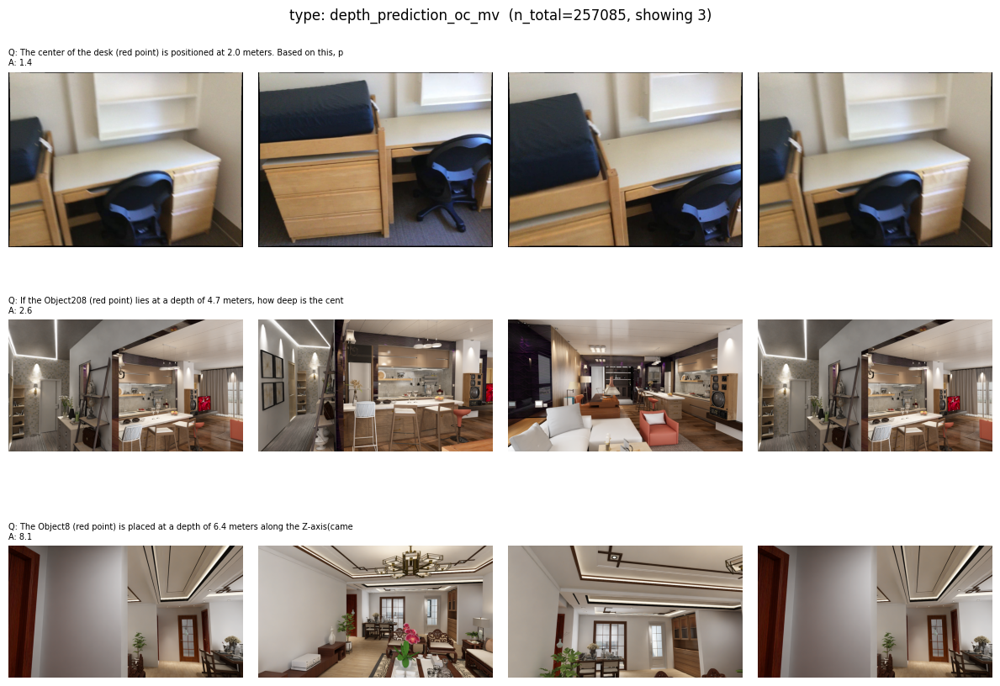

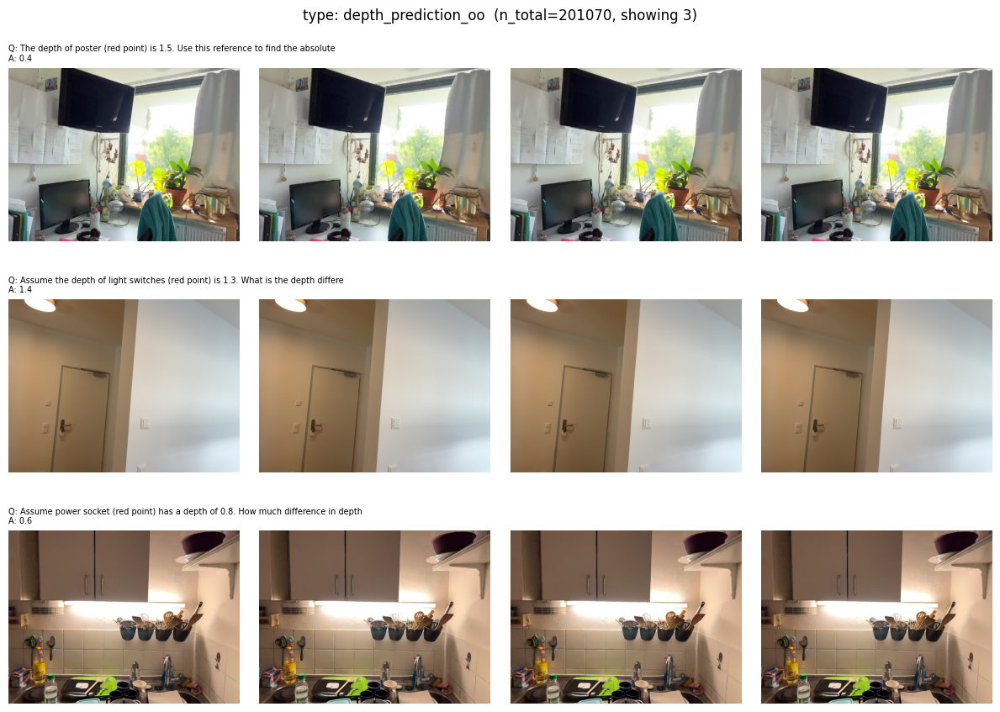

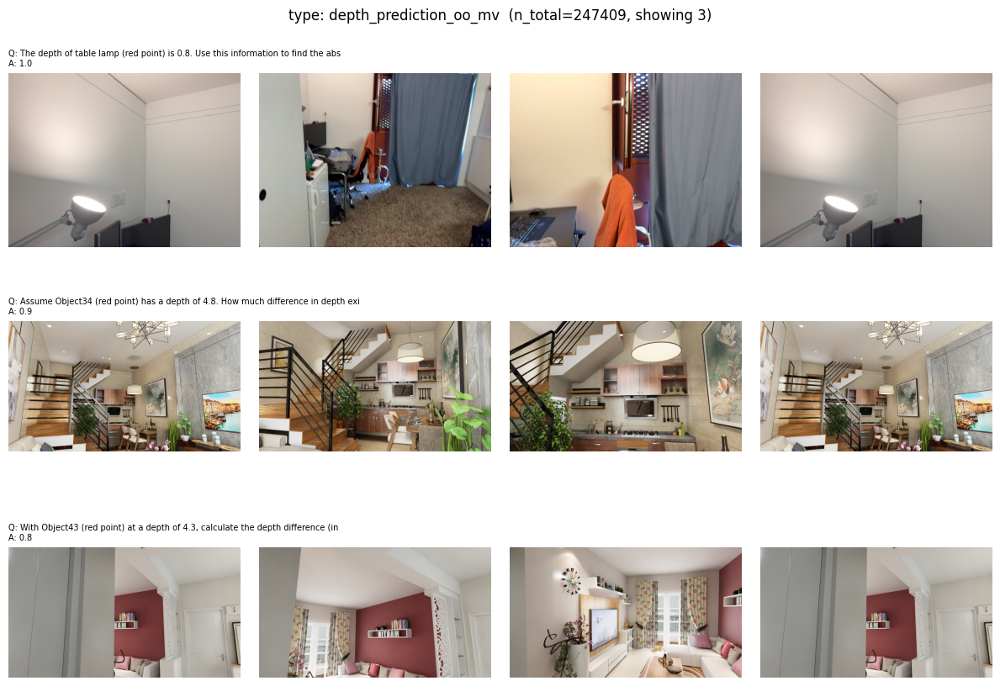

...

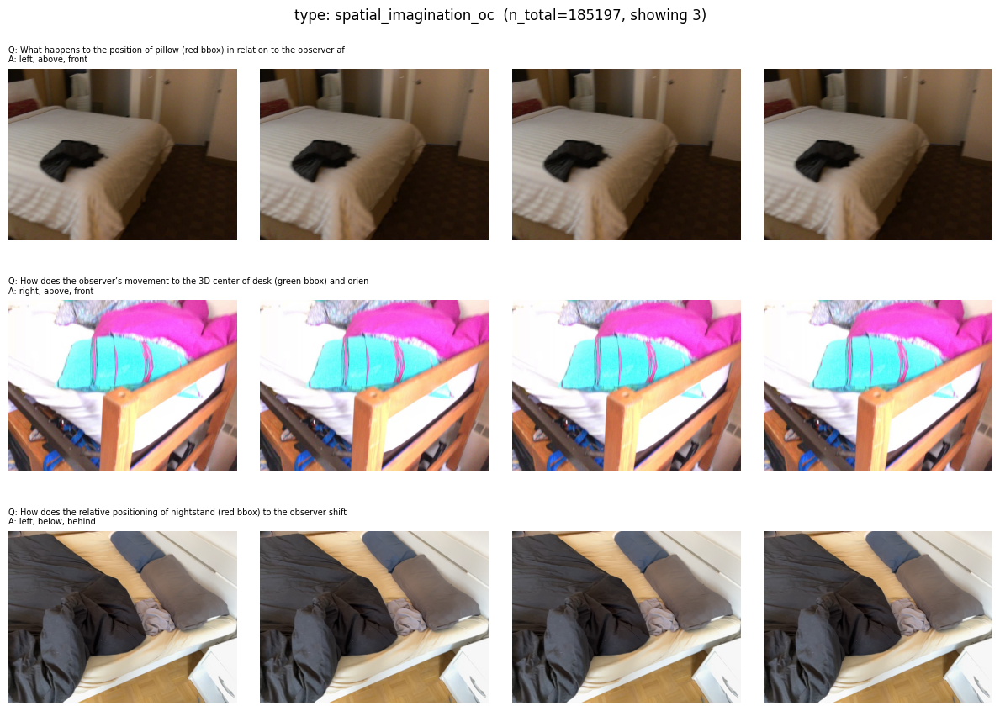

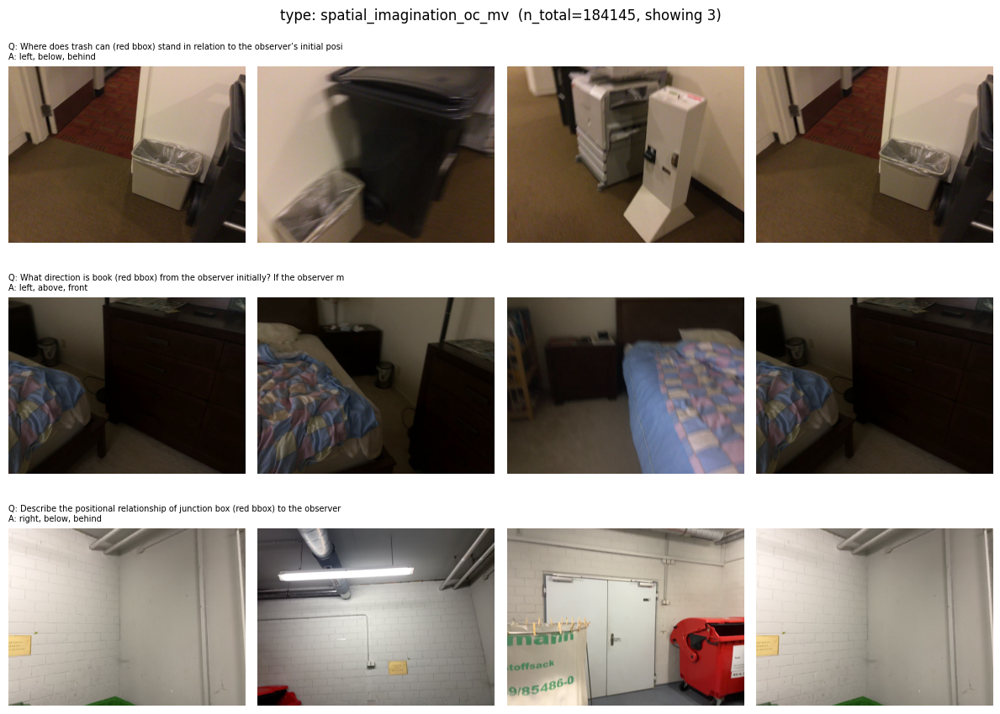

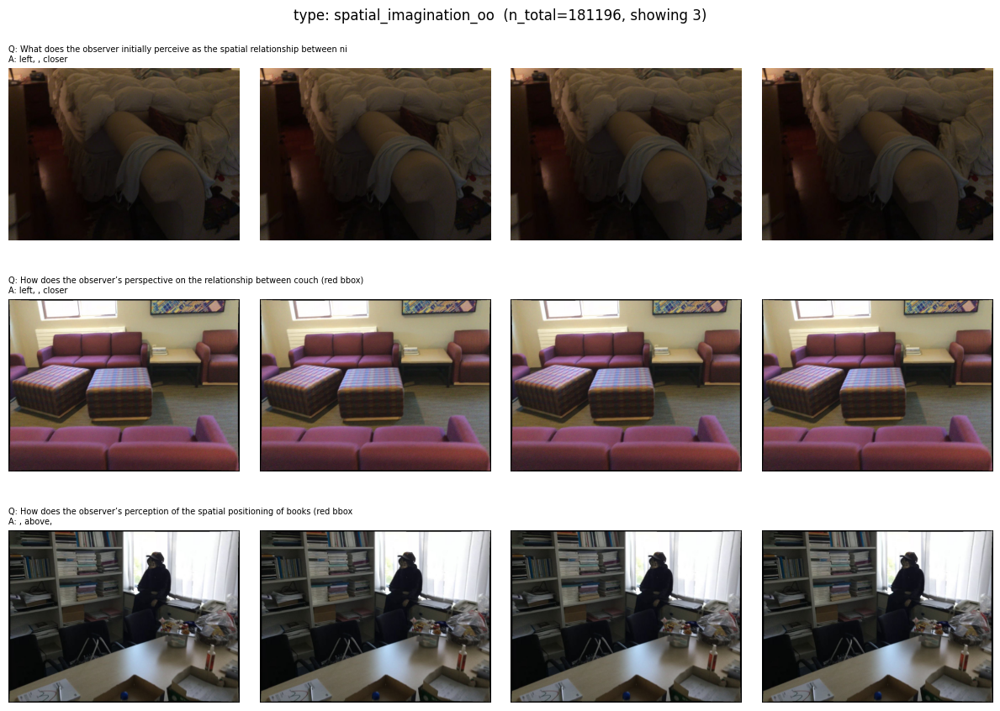

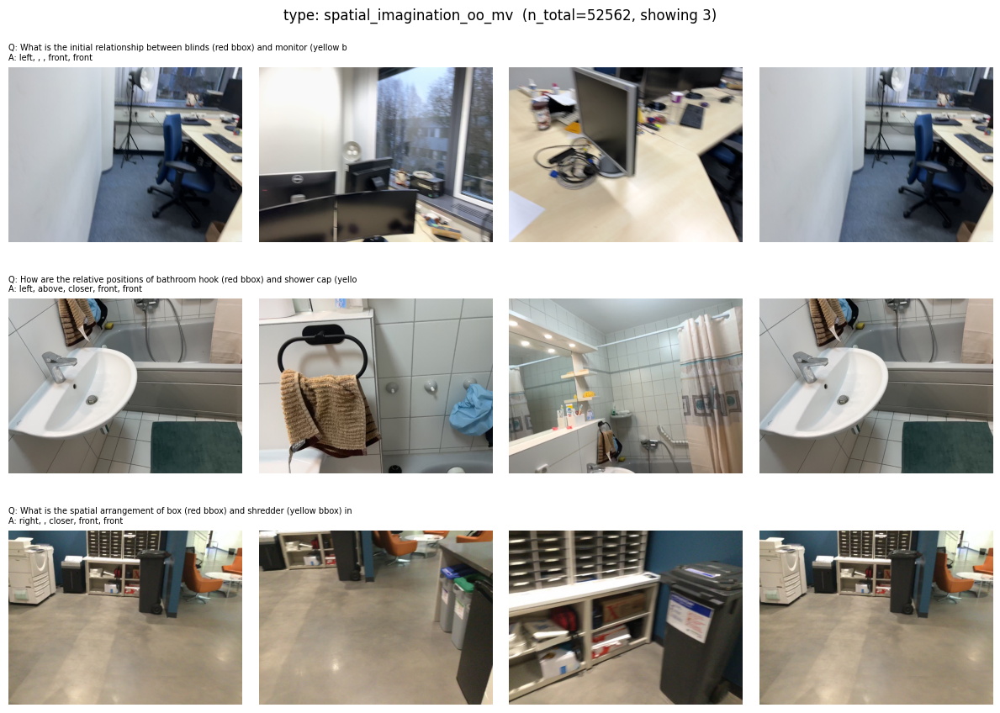

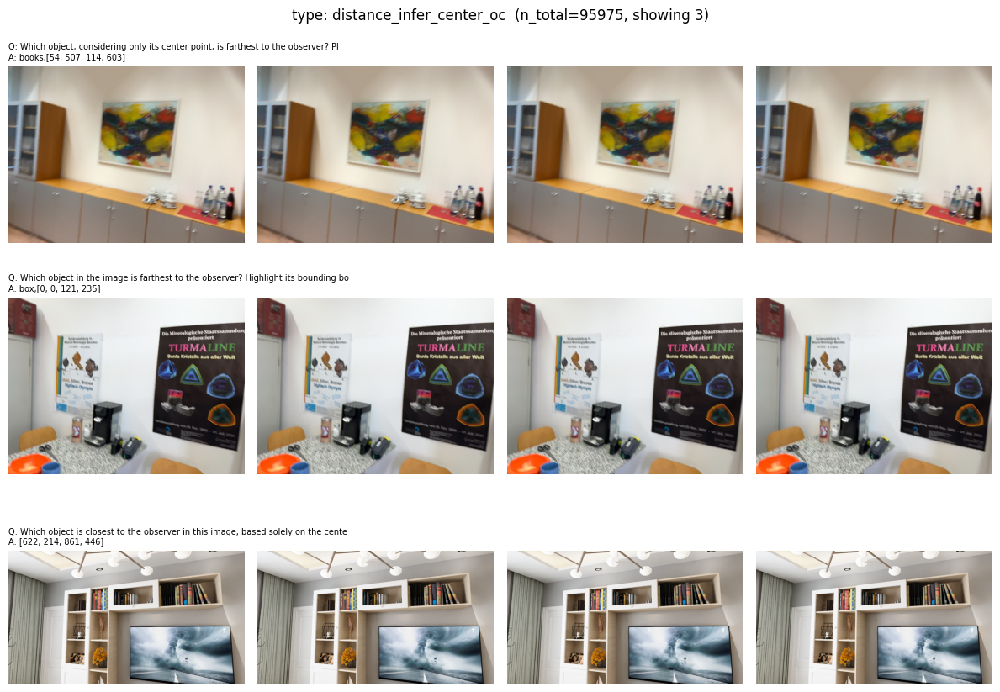

In [2]:
by_type = {}
for r in rows:
      t = r.get("type") or r.get("qa_kind", "unknown")
      by_type.setdefault(t, []).append(r)

for t, rs in sorted(by_type.items(), key=lambda kv: -len(kv[1])):
      print(f"{t:30s} n={len(rs)}")

  # 每类采样2-3个, 画图看query/target+图片
random.seed(0)
N_PER_TYPE = 3
MAX_IMGS = 4  # 每个样本最多显示几张图

for t, rs in by_type.items():
    sample = random.sample(rs, k=min(N_PER_TYPE, len(rs)))
    n = len(sample)
    fig, axes = plt.subplots(n, MAX_IMGS, figsize=(3 * MAX_IMGS, 3 * n), squeeze=False)

    for i, ex in enumerate(sample):
          imgs = ex["images"][:MAX_IMGS]
          for j in range(MAX_IMGS):
              ax = axes[i][j]
              ax.axis("off")
              if j < len(imgs):
                  ax.imshow(Image.open(imgs[j]))
              if j == 0:
                  cap = f"Q: {ex['query'][:80]}\nA: {ex['target'][:80]}"
                  ax.set_title(cap, fontsize=7, loc="left")

    fig.suptitle(f"type: {t}  (n_total={len(rs)}, showing {n})")
    fig.tight_layout()
    plt.show()

### check ori data 

In [3]:
import itertools

MAX_PER_FILE = 50  # 每个jsonl文件最多读这么多行
def iter_raw_rows_fast(spar_root, split, kinds, max_per_file=MAX_PER_FILE):
    for kind in kinds:
        for qa_path in sorted(spar_root.glob(f"*/qa_jsonl/{split}/*/{kind}/*.jsonl")):
            source = qa_path.relative_to(spar_root).parts[0]
            image_root = spar_root / source / "images"
            with open(qa_path, encoding="utf-8") as f:
                for line in itertools.islice(f, max_per_file):
                    if not line.strip():
                        continue
                    raw = json.loads(line)
                    conv = raw.get("conversations", [])
                    query = next((c["value"] for c in conv if c.get("from") == "human"), "")
                    target = next((c["value"] for c in conv if c.get("from") == "gpt"), "")
                    imgs = raw.get("image") or raw.get("sorted_image") or []
                    if isinstance(imgs, str):
                        imgs = [imgs]
                    if not query or not target or not imgs:
                        continue
                    yield {
                          "type": raw.get("type", "unknown"),
                          "qa_kind": kind,
                          "source": source,
                          "query": query,
                          "target": target,
                          "images": [str(image_root / p) for p in imgs],
                    }

raw_rows = list(iter_raw_rows_fast(spar_root, split, kinds))
print(f"Sampled rows: {len(raw_rows)}")

NameError: name 'spar_root' is not defined

### eval data

In [7]:
import collections

raw_len_by_type = collections.defaultdict(list)
for r in rows:
  raw_len_by_type[r["type"]].append(len(r["images"]))

print("raw source image count per type (min/median/max, %<8):")
for t, lens in sorted(raw_len_by_type.items()):
  lens = sorted(lens)
  n = len(lens)
  pct_short = 100 * sum(1 for x in lens if x < 8) / n
  msg = (
      f"  {t:32s} n={n:5d} min={lens[0]:3d} "
      f"median={lens[n//2]:3d} max={lens[-1]:3d} %<8={pct_short:5.1f}"
  )
  print(msg)

dup_by_type = collections.defaultdict(lambda: [0, 0])
for r in rows:
  t = r.get("type") or r.get("qa_kind", "unknown")
  imgs = r["images"]
  is_dup = len(set(imgs)) < len(imgs)
  dup_by_type[t][1] += 1
  if is_dup:
      dup_by_type[t][0] += 1

print()
print("converted train.jsonl: rows with duplicate frames (padded), by type:")
for t, pair in sorted(dup_by_type.items(), key=lambda kv: -kv[1][1]):
  ndup, ntot = pair
  pct = 100 * ndup / ntot
  print(f"  {t:32s} dup={ndup:7d}/{ntot:7d} ({pct:5.1f}%)")

raw source image count per type (min/median/max, %<8):
  camera_motion_infer              n=168241 min=  8 median=  8 max=  8 %<8=  0.0
  depth_prediction_oc              n=245860 min=  8 median=  8 max=  8 %<8=  0.0
  depth_prediction_oc_mv           n=257085 min=  8 median=  8 max=  8 %<8=  0.0
  depth_prediction_oo              n=201070 min=  8 median=  8 max=  8 %<8=  0.0
  depth_prediction_oo_mv           n=247409 min=  8 median=  8 max=  8 %<8=  0.0
  distance_infer_center_oc         n=95975 min=  8 median=  8 max=  8 %<8=  0.0
  distance_infer_center_oc_mv      n=409846 min=  8 median=  8 max=  8 %<8=  0.0
  distance_infer_center_oo         n=158616 min=  8 median=  8 max=  8 %<8=  0.0
  distance_infer_center_oo_mv      n=253327 min=  8 median=  8 max=  8 %<8=  0.0
  distance_infer_center_oo_video   n=188921 min=  8 median=  8 max=  8 %<8=  0.0
  distance_prediction_oc           n=240380 min=  8 median=  8 max=  8 %<8=  0.0
  distance_prediction_oc_mv        n=255487 min=  8 med

## Ori data to see the num of frames

In [5]:
import json, random, collections
from pathlib import Path

spar_root = Path("/glob/g01-cache/pf/Yushuo/vjepa201/source_data/spar")

# --- 1. 每个scene, image_color/video_color各有多少文件 ---
for source in ["scannet", "scannetpp", "structured3d"]:
  img_root = spar_root / source / "images"
  if not img_root.exists():
      continue
  scene_dirs = sorted(p for p in img_root.iterdir() if p.is_dir())
  sample_scenes = random.sample(scene_dirs, k=min(10, len(scene_dirs)))
  print(f"\n=== {source}: {len(scene_dirs)} scenes, sampling {len(sample_scenes)} ===")
  for sd in sample_scenes:
      n_color = len(list((sd / "image_color").glob("*"))) if (sd / "image_color").exists() else -1
      n_video = len(list((sd / "video_color").glob("*"))) if (sd / "video_color").exists() else -1
      print(f"  {sd.name:20s} image_color={n_color:5d}  video_color={n_video:5d}")

# --- 2. 对每个type, 抽几条QA行, 看它引用的是image_color还是video_color,
def sample_qa_rows(source, type_name, kind, n=5):
  rows = []
  for qa_path in (spar_root / source / "qa_jsonl" / "train" / type_name / kind).glob("*.jsonl"):
      with open(qa_path) as f:
          for line in f:
              if not line.strip():
                  continue
              rows.append(json.loads(line))
              if len(rows) >= n:
                  return rows
  return rows

for type_name in ["depth_prediction_oo", "depth_prediction_oo_mv", "obj_spatial_relation_oc",
                 "distance_prediction_oo_video", "room_size"]:
  for kind in ["sentence", "fill", "select"]:
      rows = sample_qa_rows("scannet", type_name, kind, n=3)
      if not rows:
          continue
      for r in rows:
          imgs = r.get("image") or r.get("sorted_image") or []
          if isinstance(imgs, str):
              imgs = [imgs]
          subfolders = {Path(p).parent.name for p in imgs}
          print(f"{type_name:30s}/{kind:9s} n_imgs={len(imgs)} distinct={len(set(imgs))}subfolders={subfolders}")


=== scannet: 1513 scenes, sampling 10 ===
  scene0378_01         image_color=   86  video_color=   33
  scene0064_00         image_color=   51  video_color=   33
  scene0150_02         image_color=    3  video_color=   33
  scene0421_01         image_color=   58  video_color=   33
  scene0239_00         image_color=   41  video_color=   33
  scene0415_00         image_color=   34  video_color=   33
  scene0160_04         image_color=   21  video_color=   33
  scene0300_01         image_color=   62  video_color=   33
  scene0286_01         image_color=   84  video_color=   33
  scene0028_00         image_color=   60  video_color=   33

=== scannetpp: 901 scenes, sampling 10 ===
  bb05a0c48c           image_color=   44  video_color=   32
  2489b7f4fe           image_color=   74  video_color=   32
  4c5c60fa76           image_color=   75  video_color=   32
  3db0a1c8f3           image_color=  181  video_color=   32
  cec8312f4e           image_color=  111  video_color=   32
  12b2b1c6d9 